# Linear Bayesian Modelling with Pyro

Welcome to our tutorial notebook on building a simple linear Bayesian model with Pyro! In this tutorial, you will learn the fundamentals of Bayesian modeling and how to implement it using Pyro, a powerful probabilistic programming framework. By the end of this tutorial, you will have a solid understanding of how to define and train a Bayesian model, and how to make probabilistic predictions using posterior samples. Get ready to dive into the world of Bayesian inference and unlock the full potential of your data with Pyro!

## Sections 
0. Setup
1. Defining a Model
2. Defining a Guide
3. Defining a Trainingloop
4. Inference
5. Bonus: SVI vs. MCMC/NUTS
6. Bonus: Comparison with RidgeRegression

## 0. Setup
In this section, we will set up the environment and install the necessary dependencies to run our Bayesian modeling tutorial. We will guide you through the process of installing Pyro and other required libraries, as well as importing the necessary modules and preparing the dataset. By the end of this section, you will have a fully configured environment ready for Bayesian modeling.

In [1]:
# Installing requirements from the requirements.txt file; the file was created from the poetry.lock with
# poetry export -f requirements.txt --output requirements.txt --without-hashes
!pip3 install -r requirements.txt

Ignoring colorama: markers 'python_version >= "3.8" and python_version < "4.0" and platform_system == "Windows"' don't match your environment


In [2]:
# Import pandas and numpy for data handling
import pandas as pd
import numpy as np

# Import torch and pyro for modelling and inference
import torch
from torch import nn
import pyro
from pyro.nn import PyroSample, PyroParam, PyroModule
import pyro.distributions as dist
from pyro import poutine

# Import plotly to visualize the inference
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

# Utility
from typing import List
from tqdm import tqdm

/home/marco/.cache/pypoetry/virtualenvs/introduction-to-pyro-pyladies-OqyvlXSp-py3.8/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# Loading the dependent and independent features
media = pd.read_parquet("./assets/media_prepped.parquet")
sales = pd.read_parquet("./assets/sales_prepped.parquet")

# Convert the input data to tensors
X = torch.tensor(media.to_numpy(), dtype=torch.float32)
y = torch.tensor(sales.to_numpy(), dtype=torch.float32)

## 1. Defining a Model
In this section, we will delve into the heart of Bayesian modeling by defining our probabilistic model. You will learn how to express your prior beliefs about the parameters of the model using probability distributions. We will walk you through the process of defining the likelihood function, specifying the dependencies between variables, and constructing the model using Pyro's intuitive syntax. By the end of this section, you will have a clear understanding of how to build a Bayesian model in Pyro.

In [4]:
# Define a PyroModel for predicting the revenue
# per product from the media spend
class RevenueModel(PyroModule):
    def __init__(
        self,
        media_channels: int = 7,
        sales_products: int = 2,
        bias_lower_bound: List[float] = [0.] * 2,
        bias_upper_bound: List[float] = [10_000.] * 2
    ):
        super().__init__()

        # Initialize a linear torch layer as a pyro module.
        # Keep in mind, that the linear layer has in_features, which
        # are equal to the number of sales channels and out_features
        # equal to the number of products
        self.linear_layer = PyroModule[nn.Linear](in_features=media_channels, out_features=sales_products)

        # Set the weight of the linear layer to be sampled from a PyroSamle distributions
        # Potential prior distributions include a folded normal distribution with prior
        # mu one and sigma 0.5 (feel free to experiment though!)
        self.linear_layer.weight = PyroSample(
            dist.FoldedDistribution(
                dist.Normal(torch.ones(sales_products, media_channels) * 0.5, torch.ones(sales_products, media_channels))
            ).to_event(2)
        )
        
        # Set the bias of the linear layer to be sampled from a PyroSample
        # Distribution. Potential prior distributions include a uniform distribution
        # between the minimum and the maximum of the two target variables.
        self.linear_layer.bias = PyroSample(dist.Uniform(torch.tensor(bias_lower_bound), torch.tensor(bias_upper_bound)).to_event(1))

        # Assign input shapes to instance attributes for later usage
        self.sales_products = sales_products
        self.media_channels = media_channels
        
    def forward(self, X, y=None):
        # Get the expected value of y, from the
        # current state of the linear layer
        y_hat = self.linear_layer(X)

        noise = pyro.sample(
            "noise",
            dist.HalfNormal(
                torch.tensor([1000., 1000.])
            ).expand([1, 2]).to_event(1)
        )

        # Open a pyro plate for the 2 samples per row in y
        # You can use any name, but make sure, that it is unique
        # (This is only required since we have multiple dependent
        # variables (i.e. 2 products)). If you only have a single
        # dependent variable, you don't need this first plate.
        with pyro.plate("sample", self.sales_products):

            # Open a nested plate for the number of rows in your
            # input. The idea here is, that the true y is sampled len(X)
            # times, with expected value y_hat and a sigma, that is sampled
            # per observation.
            # Again, feel free to use and name you want, just make sure, that
            # it is unique.
            with pyro.plate("data", len(X)):
                # Sample sigma from a pyro.sample.
                # Keep in mind, that the each observation
                # has an independent noise component to it.
                # So the distribution should be '.expand'ed to the
                # shape of y_hat.

                # Sample observations from a suitable distribution.
                # Potential distributions include a normal distribution of
                # mu y_hat and sigma.
                pyro.sample("obs", dist.Normal(y_hat, noise), obs=y)

        return y_hat

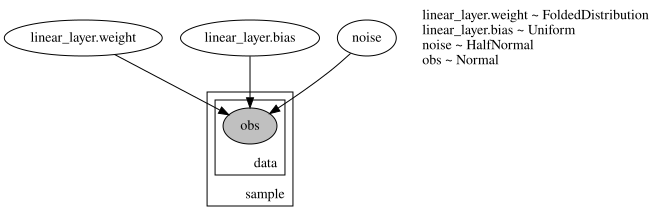

In [5]:
# Visualize the model
pyro.render_model(RevenueModel(), model_args=(X, y), render_params=True, render_distributions=True)

In [6]:
# Check the trace
trace = poutine.trace(RevenueModel()).get_trace(X, y)
trace.compute_log_prob()
print(trace.format_shapes())

           Trace Shapes:              
            Param Sites:              
           Sample Sites:              
linear_layer.weight dist         | 2 7
                   value         | 2 7
                log_prob         |    
  linear_layer.bias dist         | 2  
                   value         | 2  
                log_prob         |    
              noise dist       1 | 2  
                   value       1 | 2  
                log_prob       1 |    
             sample dist         |    
                   value       2 |    
                log_prob         |    
               data dist         |    
                   value     140 |    
                log_prob         |    
                obs dist 140   2 |    
                   value 140   2 |    
                log_prob 140   2 |    


## 2. Defining a Guide
In Bayesian modeling, a guide is a probability distribution that approximates the posterior distribution of the model's parameters given the observed data. In this section, we will teach you how to define a guide function using Pyro. You will learn how to choose an appropriate family of distributions for the guide, initialize the guide's parameters, and use Pyro's automatic guide construction utilities. By the end of this section, you will be equipped with the knowledge to construct an effective guide for your Bayesian model.

In [7]:
# # Define the guide required for performing SVI
# class RevenueGuide(PyroModule):
#     def __init__(
#         self,
#         media_channels: int = 7,
#         sales_products: int = 2,
#         bias_lower_bound: List[float] = [0.] * 2,
#         bias_upper_bound: List[float] = [10_000.] * 2
#     ):
#         super().__init__()

#         # Initialize the same linear layer as in the guide
#         self.linear_layer = PyroModule[nn.Linear](in_features=media_channels, out_features=sales_products)

#         # Define the hyperparameters as learnable parameters for bias and weight
#         # of the linear layer.
#         # If you chose e.g. a normal distribution for the weights, and a uniform
#         # distribution for the bias, you need to initialize the mu and sigma of the
#         # normal distribution and the min and max of the uniform distribution.
#         # Keep in mind, that the parameter tensors should have the same shape as the
#         # distributions they are for.
#         # You can initialize the parameters at any value, but it can be adventageous
#         # for the convergence, to choose the same values as in the priors of your model.
#         # Keep in mind that sigma values should be positive, so please add a constraint
#         # to your sigma parameters.
#         # Don't forget to do the same for the noise value!
#         self.noise_sigma = pyro.param("noise_sigma", torch.tensor([1000.] * 2), constraint=dist.constraints.greater_than_eq(0.))
#         self.weight_mu = pyro.param("weight_mu", torch.ones(sales_products, media_channels))
#         self.weight_sigma = pyro.param("weight_sigma", torch.ones(sales_products, media_channels) * 0.5, constraint=dist.constraints.greater_than_eq(0.))
#         self.bias_min = pyro.param("bias_min", torch.tensor(bias_lower_bound))
#         self.bias_max = pyro.param("bias_max", torch.tensor(bias_upper_bound))

#         # Assign media_channels and sales_products to instance attributes
#         # for later usage.
#         self.media_channels = media_channels
#         self.sales_products = sales_products

#     def forward(self, X, y=None):
#         # Now define the guide for your model
#         # Keep in mind, that the guide's forward call is
#         # strictly required to follow the same signature
#         # as the model, but teh guiude does not use y_hat in it's
#         # sampling.

#         # Sample the bias and weight for the linear layer, using the above
#         # defined PyroParam attributes as distribution parameters
#         self.linear_layer.weight = PyroSample(
#             dist.FoldedDistribution(
#                 dist.Normal(self.weight_mu, self.weight_sigma)
#             ).to_event(2)
#         )
#         self.linear_layer.bias = PyroSample(
#             dist.Uniform(self.bias_min, self.bias_max).to_event(1)
#         )

#         # TODO: Write comment
#         y_hat = self.linear_layer(X)

#         # TODO: Write comment
#         noise = pyro.sample(
#             "noise",
#             dist.HalfNormal(
#                 self.noise_sigma
#             ).to_event(1)
#         )

#         return y_hat

#         # # Now the first plate again.
#         # # Make sure that it has the same name as the equivalent
#         # # plate in your model.
#         # with pyro.plate("sample", self.sales_products):

#         #     # Now the nested, second plate.
#         #     # Should be equivalent to the associated plate
#         #     # in the model.
#         #     with pyro.plate("data", len(X)):
#         #         # Now sample your noise with the parameters, that you
#         #         # assigned above during the initialization.
#         #         noise = pyro.sample(
#         #             "noise",
#         #             dist.HalfNormal(
#         #                 self.noise_sigma
#         #             ).expand([len(X), self.sales_products])
#         #         )

#         #         # And finally, sample your observations, but WITHOUT
#         #         # using the obs keyword
#         #         pyro.sample("obs", dist.Normal(y_hat, noise))

In [8]:
# # Display Trace
# trace = poutine.trace(RevenueGuide()).get_trace(X, y)
# trace.compute_log_prob()
# print(trace.format_shapes())

## 3. Defining a Trainingloop
Training a Bayesian model involves updating the guide's parameters to fit the posterior distribution to the observed data. In this section, we will show you how to define a training loop that iterates over the dataset, performs parameter updates, and tracks the model's performance. You will learn about gradient descent optimization, the use of Pyro's stochastic variational inference (SVI) module, and how to monitor the convergence of your model. By the end of this section, you will be ready to train your Bayesian model effectively.

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:05<00:00, 187.65it/s]


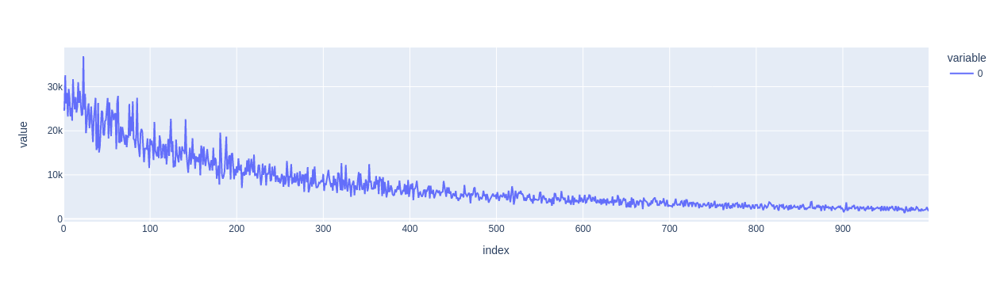

In [9]:
# Clear the param store before a new training run
# (good practice)
pyro.clear_param_store()

# Initialize your guide and model
model = RevenueModel()
guide = pyro.infer.autoguide.AutoDiagonalNormal(model)

# Initialize your optimizer and loss
optimizer = pyro.optim.Adam({"lr": 1e-3})
loss = pyro.infer.Trace_ELBO(retain_graph=False)

# Initialize the SVI
svi = pyro.infer.SVI(
    model=model,
    guide=guide,
    optim=optimizer,
    loss=loss,
)

# Define the training loop
EPOCHS = 1_000

# Define the loop as taking a 'step' in each Epoch
# Feel free to print and/or store the loss as you'd
# like.
losses = []
for epoch in tqdm(range(EPOCHS), total=EPOCHS):
    loss = svi.step(X, y)
    losses.append(loss / len(X))

# Use plotly, or any other visualization library to show the decrease of the loss
px.line(losses)

## 4. Inference
Once the model is trained, we can perform inference to make probabilistic predictions or estimate uncertainties. In this section, we will guide you through the process of using the trained model and guide to perform inference on new data points. You will learn how to draw posterior samples, compute predictive distributions, and visualize the results. By the end of this section, you will have the skills to leverage the power of Bayesian inference in your own projects.

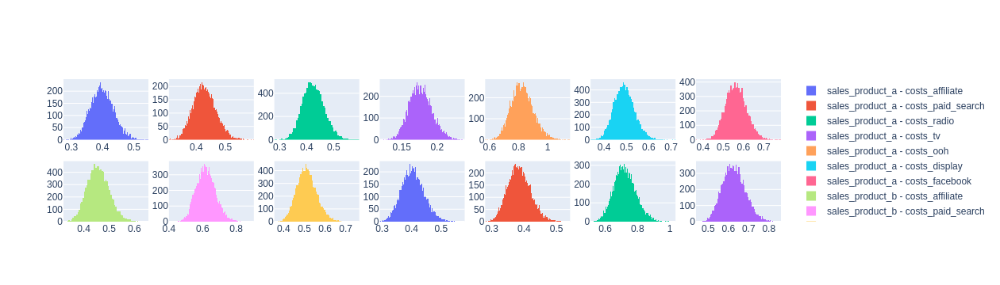

In [10]:
# Initialize the predicitive class to sample from the fitted model.
# Initialize it with the model, the guide and the number of samples that you want to draw for each variable
predictive = pyro.infer.Predictive(
    model=model,
    guide=guide,
    num_samples=10_000
)

# To get the samples per parameter (including the predicted observations),
# pass the input tensor you want to sample for to the sampler.
# The output will be a dictionary with the parameter names as keys and the
# parameter's samples as values.
samples = predictive(X)

# Fetch the estimated coefficients for visualization.
# Pyro may add arbitrary dimensions during sampling, so make
# sure to reshape the sampled tensor intor a suitable shape
beta_hat = samples["linear_layer.weight"].reshape(-1, 2, 7).detach().cpu().numpy()
beta_hat_prime = np.moveaxis(beta_hat, 0, -1)

# Visualize the distribution of samples with plotly or any other library you like
fig = make_subplots(rows=2, cols=7)

for row, product in enumerate(beta_hat_prime, start=1):
    for column, coefficient_samples in enumerate(product, start=1):
        fig.add_trace(
            go.Histogram(x=coefficient_samples, name=f"{sales.columns[row - 1]} - {media.columns[column - 1]}"), row=row, col=column,
        )
        
fig.show()

## 5. Bonus: SVI vs. MCMC/NUTS
Stochastic variational inference (SVI) is a popular method for approximating posterior distributions, but it is not the only option. In this bonus section, we will explore the differences between SVI and Markov Chain Monte Carlo (MCMC) methods, with a focus on the No-U-Turn Sampler (NUTS). We will discuss the advantages and limitations of each approach and provide guidance on when to choose one over the other. By the end of this section, you will have a broader understanding of different inference methods.

## 6. Bonus: Comparison with Ridge Regression
Bayesian modeling offers a unique perspective on traditional machine learning algorithms. In this bonus section, we will compare our Bayesian model with a classic machine learning algorithm: Ridge Regression. You will learn about the differences in assumptions, interpretability, and regularization between the two approaches. By the end of this section, you will have gained insights into how Bayesian modeling can provide distinct advantages over traditional methods.